# Imports

In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from stability_gnn.data import load_dataset
from stability_gnn.model import make_predictions, test_and_evaluate, train_model
from stability_gnn.visualization import display_geo_map_optimized, plot_binned_grid, plot_state_grid
import torch
from torch.nn import Linear
import torch.nn.functional as F
from torch_geometric.nn import GCNConv
from torch_geometric.nn import global_max_pool

# Loading the Model

## Defining the Model Architecture

In [2]:
class GCN(torch.nn.Module):
    def __init__(self, hidden_channels):
        super(GCN, self).__init__()
        torch.manual_seed(3707)
        self.conv1 = GCNConv(365, hidden_channels)
        self.conv2 = GCNConv(hidden_channels, hidden_channels) ## Same size to refine node embeddings
        self.conv3 = GCNConv(hidden_channels, hidden_channels)
        self.lin = Linear(hidden_channels, 2)

    def forward(self, x, edge_index, batch):
        ## STEP 1: To obtain node embeddings
        x = self.conv1(x, edge_index) 
        x = F.dropout(x, p=0.3, training=self.training)
        x = x.relu()
        x = self.conv2(x, edge_index)
        x = F.dropout(x, p=0.3, training=self.training)

        ## STEP 2: Readout layer
        x = global_max_pool(x, batch) ## Computes batch wise mean of the graphs that have been batched. Returns one feature vector per batch

        ## STEP 3: Apply a final classifier
        x = F.dropout(x, p=0.3, training=self.training) ## Dropout is regularization to prevent overfitting
        x = self.lin(x)

        return x

## Loading the Weights

In [3]:
model = GCN(hidden_channels=64)
# # model.load_state_dict(torch.load('model_log_bias.pth'))
# model.load_state_dict(torch.load('model_vanilla.pth'))

# Variance Analysis

In [4]:
bias = 1e-2

In [5]:
land_only_india_dataset = load_dataset(
    dataset_path='../../extracted_gsmap_isro_data/filtered_india_land_points_20_years_new.csv',
    bias=0,
    log_transform=False, ## The dataset is alread log-transformed since it was extracted from the original log-transformed dataset
    add_loc=False
)

...Loading Dataset...


In [6]:
print(f"The shape of the dataset: {land_only_india_dataset.shape}")

The shape of the dataset: (29026, 7673)


In [7]:
land_only_india_dataset.head(10)

,LOC_ID,LONGITUDE,LATITUDE,VALID_POINTS,2001-01-01,2001-01-02,2001-01-03,2001-01-04,2001-01-05,2001-01-06,...,2022-12-22,2022-12-23,2022-12-24,2022-12-25,2022-12-26,2022-12-27,2022-12-28,2022-12-29,2022-12-30,2022-12-31
0,1060,68.25,23.75,192778,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,...,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995
1,1061,68.25,23.85,192778,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,...,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995
2,1360,68.35,23.65,192778,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,...,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995
3,1361,68.35,23.75,192778,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,...,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995
4,1363,68.35,23.95,192778,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,...,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995
5,1659,68.45,23.45,192778,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,...,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995
6,1660,68.45,23.55,192778,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,...,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995
7,1662,68.45,23.75,192778,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,...,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995
8,1664,68.45,23.95,192778,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,...,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995
9,1960,68.55,23.45,192778,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,...,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995


In [8]:
land_only_india_dataset['RAINFALL_VARIANCE'] = land_only_india_dataset.iloc[:, 4:].var(axis=1)

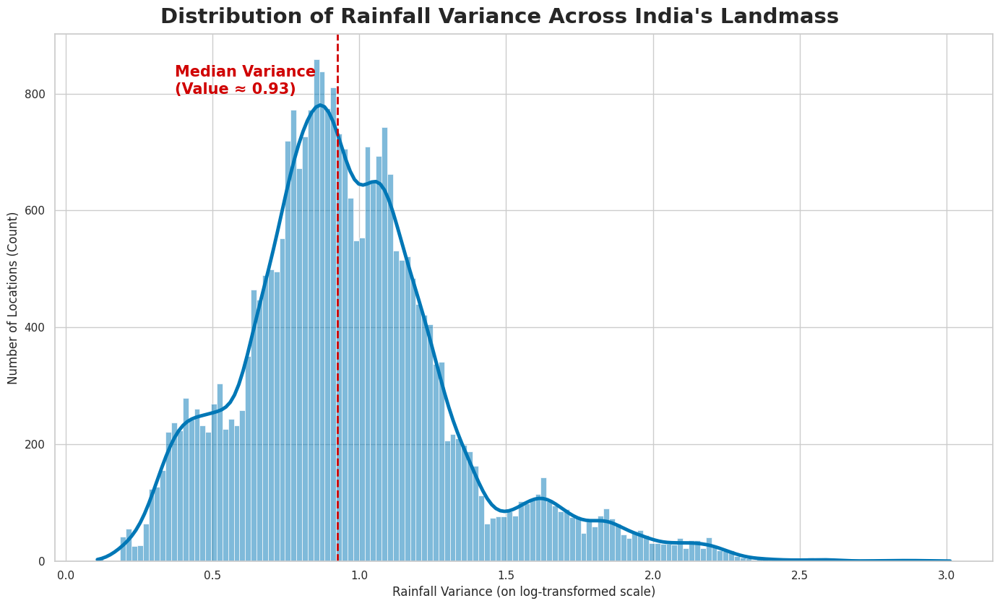

In [9]:
# To set a clean theme and a suitable figure size.
sns.set_theme(style="whitegrid")
plt.figure(figsize=(14, 9))

# To create the histogram with enhancements.
ax = sns.histplot(
    data=land_only_india_dataset,
    x='RAINFALL_VARIANCE',
    bins=150,  # Adjusted bins slightly for the new distribution
    color="#0077b6",  # A clear, accessible blue
    kde=True,
    line_kws={'linewidth': 3.5, 'color': '#03045e'}
)

# To add a descriptive title and a subtitle explaining the context.
plt.suptitle(
    "Distribution of Rainfall Variance Across India's Landmass",
    fontsize=21,
    fontweight='bold',
    y=0.93
)

# To add clear, descriptive axis labels.
ax.set_xlabel("Rainfall Variance (on log-transformed scale)", fontsize=12)
ax.set_ylabel("Number of Locations (Count)", fontsize=12)

# --- 3. Add Annotations to Tell the Story ---
# To find the median value to highlight the central tendency.
median_val = land_only_india_dataset['RAINFALL_VARIANCE'].median()
plt.axvline(x=median_val, color='#d00000', linestyle='--', linewidth=2)

# To add text that explains what the main peak represents.
plt.text(
    median_val * 0.4, 800, f'Median Variance\n(Value ≈ {median_val:.2f})',
    color='#d00000', fontsize=15, fontweight='bold'
)

# To finalize the layout and save the plot.
plt.tight_layout(rect=[0, 0, 1, 0.96])

# plt.savefig('../images/land_only_rainfall_variance.png')
plt.savefig('../images/land_only_rainfall_variance.pdf', format='pdf')
plt.show()

In [10]:
variance_sorted_land_only_india_dataset = land_only_india_dataset.sort_values(by='RAINFALL_VARIANCE', ascending=False).reset_index(drop=True)

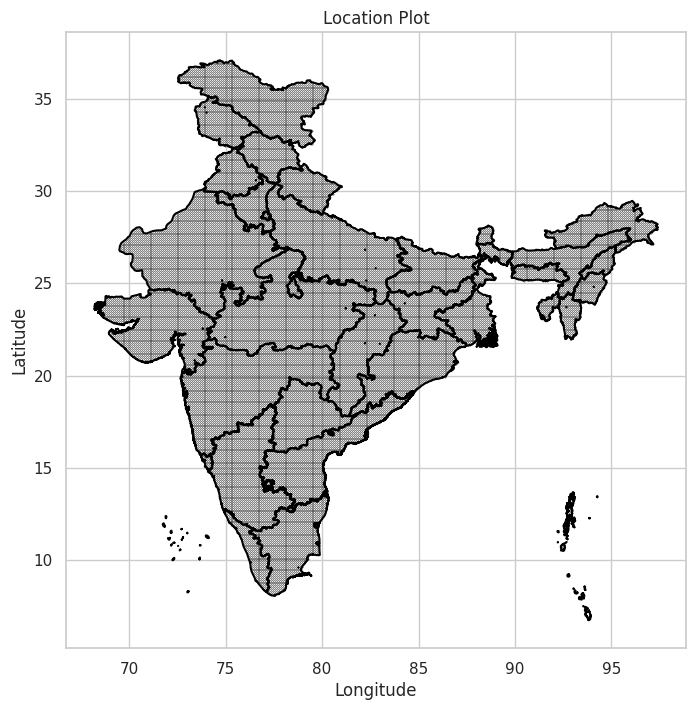

In [11]:
plot_state_grid(
    dataframe=land_only_india_dataset,
    savename='../images/land_only_gridpoints.pdf',
    figsize=(8,8)
)

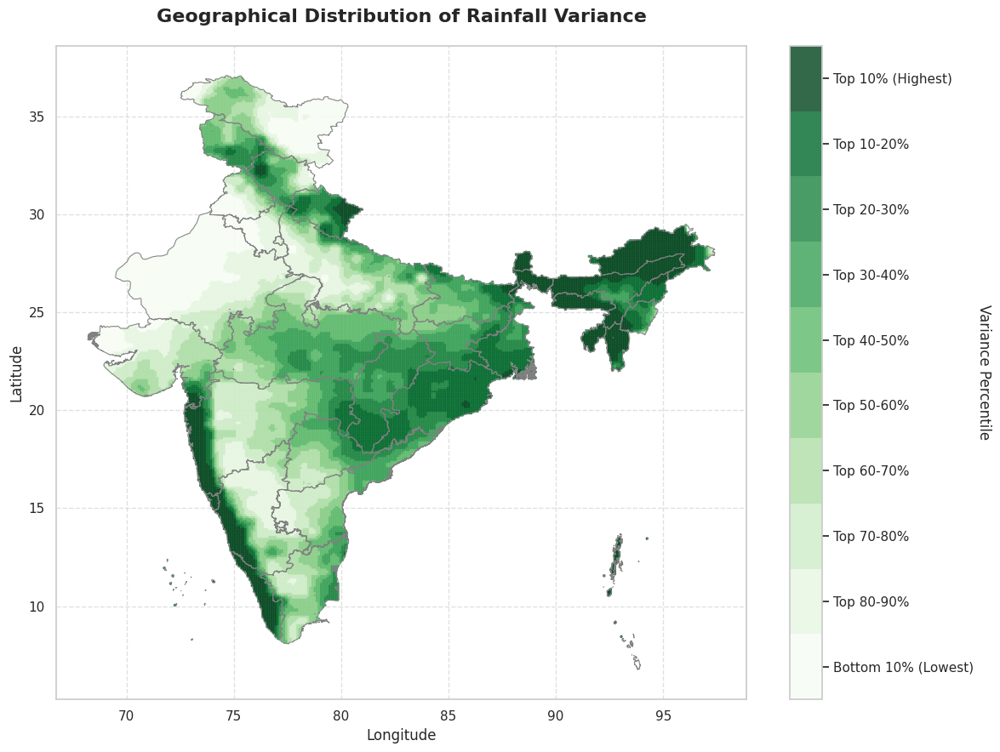

In [11]:
plot_binned_grid(
    dataframe=variance_sorted_land_only_india_dataset,
    colormap='Greens',
    savename='../images/land_only_rainfall_variance_map.pdf',
    figsize=(12,9),
    marker_size=2
)

# Training

In [13]:
variance_sorted_land_only_india_dataset.head(10)

,LOC_ID,LONGITUDE,LATITUDE,VALID_POINTS,2001-01-01,2001-01-02,2001-01-03,2001-01-04,2001-01-05,2001-01-06,...,2022-12-24,2022-12-25,2022-12-26,2022-12-27,2022-12-28,2022-12-29,2022-12-30,2022-12-31,RAINFALL_VARIANCE,bin_id
0,70305,91.25,25.25,192778,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,...,0.00995,0.00995,2.202772,0.751710,0.00995,0.00995,0.00995,0.00995,3.012830,9
1,70004,91.15,25.25,192778,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,...,0.00995,0.00995,2.204174,0.761958,0.00995,0.00995,0.00995,0.00995,3.004278,9
2,69703,91.05,25.25,192778,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,...,0.00995,0.00995,2.188995,0.760591,0.00995,0.00995,0.00995,0.00995,2.959266,9
3,70606,91.35,25.25,192778,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,...,0.00995,0.00995,2.150195,0.688496,0.00995,0.00995,0.00995,0.00995,2.947642,9
4,70306,91.25,25.35,192778,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,...,0.00995,0.00995,2.168961,0.762399,0.00995,0.00995,0.00995,0.00995,2.911668,9
5,69402,90.95,25.25,192778,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,...,0.00995,0.00995,2.168052,0.752609,0.00995,0.00995,0.00995,0.00995,2.910938,9
6,70005,91.15,25.35,192778,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,...,0.00995,0.00995,2.170461,0.763392,0.00995,0.00995,0.00995,0.00995,2.907669,9
7,69101,90.85,25.25,192778,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,...,0.00995,0.00995,2.148496,0.742447,0.00995,0.00995,0.00995,0.00995,2.879895,9
8,69704,91.05,25.35,192778,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,...,0.00995,0.00995,2.155054,0.767491,0.00995,0.00995,0.00995,0.00995,2.873330,9
9,68800,90.75,25.25,192778,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,...,0.00995,0.00995,2.126459,0.727707,0.00995,0.00995,0.00995,0.00995,2.859174,9


In [14]:
variance_sorted_land_only_india_dataset.shape

(29026, 7675)

In [15]:
# --- 1. Define the Fixed Sample Size ---
# Set the desired number of samples (N) to take from *each* of the 10 bins.
N_SAMPLES_PER_BIN = 200 

# --- 2. Group the Data and Apply Sampling ---
# Use .groupby() to split the data by bin_id
# Use .sample() to randomly select N_SAMPLES_PER_BIN from each group
train_dataset = (
    variance_sorted_land_only_india_dataset.groupby('bin_id')
    .sample(
        n=N_SAMPLES_PER_BIN, 
        random_state=42, # Use random_state for reproducible sampling
        # 'replace=True' can be used if any bin has fewer than N_SAMPLES_PER_BIN
        # but for clean sampling, 'replace=False' (default) is best.
    )
    .reset_index(drop=True)
)

print(f"Total rows sampled: {len(train_dataset)}")
print(f"Expected rows: 10 bins * {N_SAMPLES_PER_BIN} samples = {10 * N_SAMPLES_PER_BIN} rows")
print("\nSample counts per bin in the new training set:")
# The output should show the same count for every bin_id
print(train_dataset['bin_id'].value_counts().sort_index())

Total rows sampled: 2000
Expected rows: 10 bins * 200 samples = 2000 rows

Sample counts per bin in the new training set:
bin_id
0    200
1    200
2    200
3    200
4    200
5    200
6    200
7    200
8    200
9    200
Name: count, dtype: int64


In [16]:
train_dataset.head(10)

,LOC_ID,LONGITUDE,LATITUDE,VALID_POINTS,2001-01-01,2001-01-02,2001-01-03,2001-01-04,2001-01-05,2001-01-06,...,2022-12-24,2022-12-25,2022-12-26,2022-12-27,2022-12-28,2022-12-29,2022-12-30,2022-12-31,RAINFALL_VARIANCE,bin_id
0,24886,76.15,28.45,192778,1.611544,0.00995,0.00995,0.00995,0.00995,0.00995,...,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.509715,0
1,15229,72.95,25.95,192778,0.009950,0.00995,0.00995,0.00995,0.00995,0.00995,...,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.455596,0
2,17345,73.65,26.85,192778,0.009950,0.00995,0.00995,0.00995,0.00995,0.00995,...,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.483557,0
3,17056,73.55,28.05,192778,0.009950,0.00995,0.00995,0.00995,0.00995,0.00995,...,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.385565,0
4,14628,72.75,26.05,192778,0.009950,0.00995,0.00995,0.00995,0.00995,0.00995,...,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.426966,0
5,10127,71.25,27.45,192778,0.009950,0.00995,0.00995,0.00995,0.00995,0.00995,...,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.296606,0
6,19471,74.35,28.75,192778,0.009950,0.00995,0.00995,0.00995,0.00995,0.00995,...,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.431551,0
7,7416,70.35,27.25,192778,0.009950,0.00995,0.00995,0.00995,0.00995,0.00995,...,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.217335,0
8,22490,75.35,29.65,192778,0.009950,0.00995,0.00995,0.00995,0.00995,0.00995,...,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.382094,0
9,22498,75.35,30.45,192778,0.199948,0.00995,0.00995,0.00995,0.00995,0.00995,...,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.00995,0.467287,0


...Training Model...
...Generating graphs: training_mode: True, threshold_percentile: 75...
The years under consideration are: [2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022]
...Making year wise dictionary...
...Making cosine similarity dictionary...


/home/prad/code/precipitation_gauge_gnn/code_files/model_notebooks/stability_gnn/data.py:131: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:278.)
  tensor_data = torch.tensor(vectors, dtype=torch.float32)


...Making mean nodes...
...Making threshold dictionary...
...Making Graphs...
...Generating Labels...
...Computing Class Weights...
The number of zero locations: 1265 out of 1600 locations


/home/prad/.local/lib/python3.8/site-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch: 001, Train Accuracy: 0.9131, Validate Accuracy: 0.9125, Patience Counter: 0
Epoch: 002, Train Accuracy: 0.8719, Validate Accuracy: 0.8600, Patience Counter: 0
Epoch: 003, Train Accuracy: 0.9506, Validate Accuracy: 0.9375, Patience Counter: 1
Epoch: 004, Train Accuracy: 0.9481, Validate Accuracy: 0.9350, Patience Counter: 0
Epoch: 005, Train Accuracy: 0.9581, Validate Accuracy: 0.9475, Patience Counter: 1
Epoch: 006, Train Accuracy: 0.9244, Validate Accuracy: 0.9175, Patience Counter: 0
Epoch: 007, Train Accuracy: 0.9606, Validate Accuracy: 0.9475, Patience Counter: 1
Epoch: 008, Train Accuracy: 0.9675, Validate Accuracy: 0.9550, Patience Counter: 2
Epoch: 009, Train Accuracy: 0.9725, Validate Accuracy: 0.9450, Patience Counter: 0
Epoch: 010, Train Accuracy: 0.9169, Validate Accuracy: 0.9025, Patience Counter: 1
Epoch: 011, Train Accuracy: 0.9744, Validate Accuracy: 0.9600, Patience Counter: 2
Epoch: 012, Train Accuracy: 0.9669, Validate Accuracy: 0.9600, Patience Counter: 0
Epoc

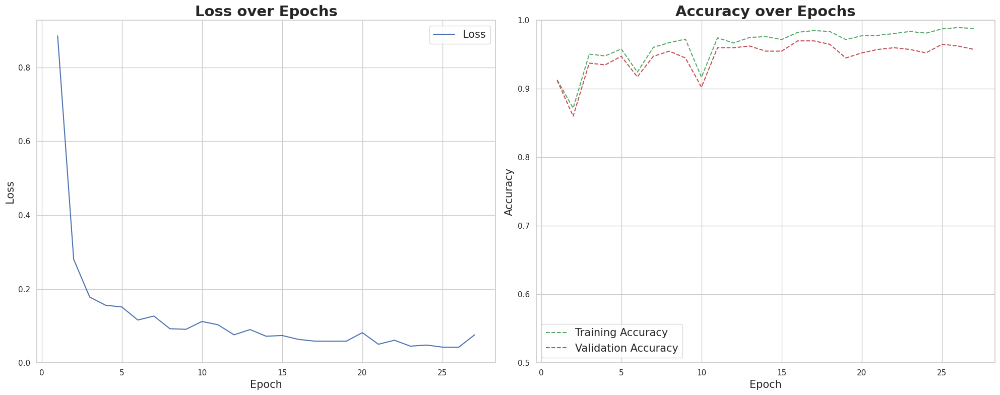

...Plotting t-SNE...


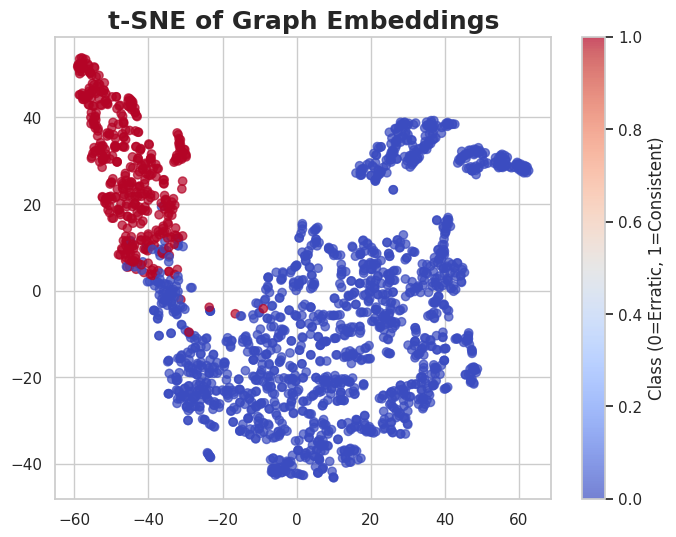

In [17]:
train_graphs, validation_graphs, graphs, threshold_value = train_model(
    train_dataframe=train_dataset,
    model=model,
    threshold_percentile=75
)

...Plotting 3 graphs...
The randomly selected TRGCODE is 28075


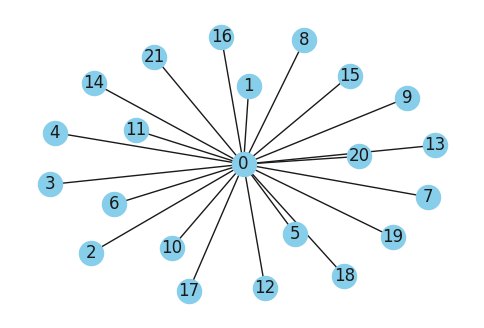

The randomly selected TRGCODE is 44045


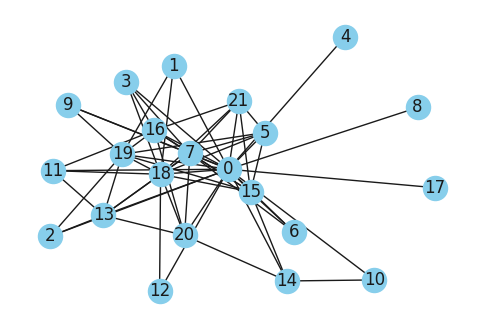

The randomly selected TRGCODE is 24132


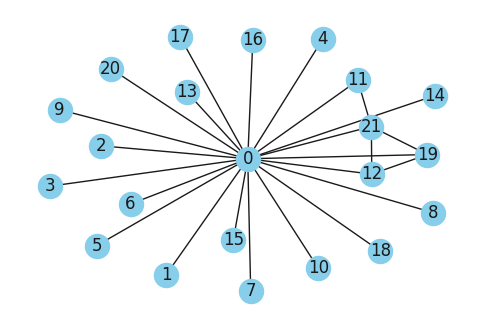

In [18]:
from stability_gnn.visualization import display_graph
display_graph(graphs=train_graphs, num_graphs=3)

In [19]:
y_pred_validate = make_predictions(
    model=model,
    graphs=validation_graphs
)

...Making predictions...


In [20]:
y_pred_all = make_predictions(
    model=model,
    graphs=graphs
)

...Making predictions...


In [21]:
y_pred = list()
y_true = list()

for id, graph in validation_graphs.items():
    y_pred.append(y_pred_validate[id])
    y_true.append(graph.y.item())

print(len(y_pred))
print(len(y_true))

400
400


[[304   4]
 [ 13  79]]

Classification Report:
              precision    recall  f1-score   support

     Erratic       0.96      0.99      0.97       308
  Consistent       0.95      0.86      0.90        92

    accuracy                           0.96       400
   macro avg       0.96      0.92      0.94       400
weighted avg       0.96      0.96      0.96       400



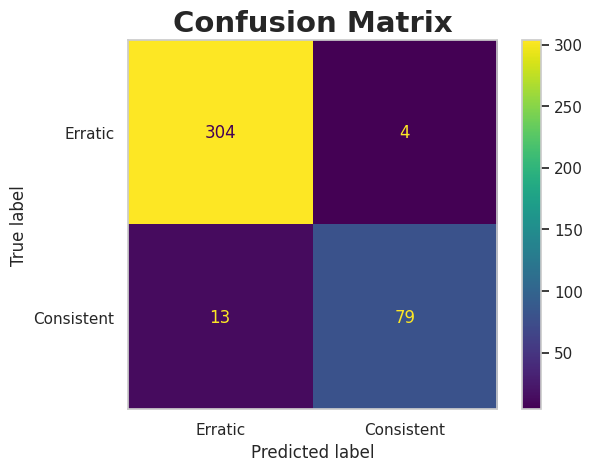

In [22]:
cm = confusion_matrix(y_true, y_pred)
print(cm)

ConfusionMatrixDisplay(cm, display_labels=['Erratic', 'Consistent']).plot()
plt.title('Confusion Matrix', fontsize=21, fontweight='bold')
plt.grid(False)
plt.savefig('../images/cm_validation.pdf', format='pdf')

print('\nClassification Report:')
print(classification_report(y_true, y_pred, target_names=['Erratic', 'Consistent']))

...Plotting geographical map...


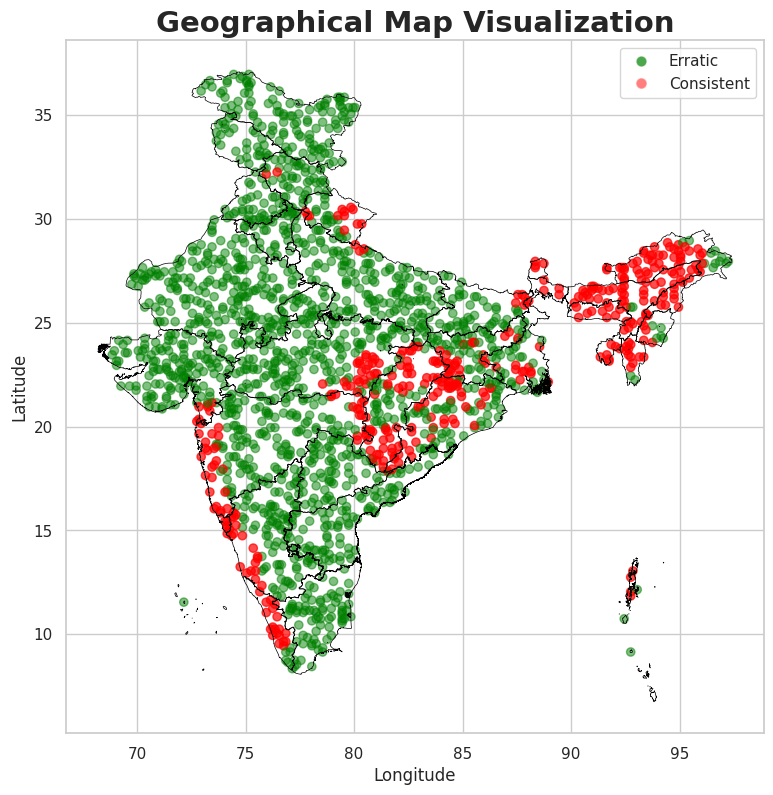

In [23]:
display_geo_map_optimized(
    dataframe=train_dataset,
    y_pred=y_pred_all,
    shapefile_path='/home/prad/code/precipitation_gauge_gnn/shapefiles/india/india_updated_state_boundary.shp',
    ids=graphs.keys(),
    transform=False,
    figsize=(9, 9),
    savename='../images/geo_map_training_and_validation.pdf'
)

# Testing

## Full India

...Generating graphs: training_mode: False, threshold_percentile: 75...
The years under consideration are: [2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022]
...Making year wise dictionary...
...Making cosine similarity dictionary...
...Making mean nodes...
...Making Graphs...
...Generating Labels...
...Making predictions...
...Getting true labels...
[[22601   342]
 [  741  5342]]

Classification Report:
              precision    recall  f1-score   support

     Erratic       0.97      0.99      0.98     22943
  Consistent       0.94      0.88      0.91      6083

    accuracy                           0.96     29026
   macro avg       0.95      0.93      0.94     29026
weighted avg       0.96      0.96      0.96     29026

...Plotting geographical map...


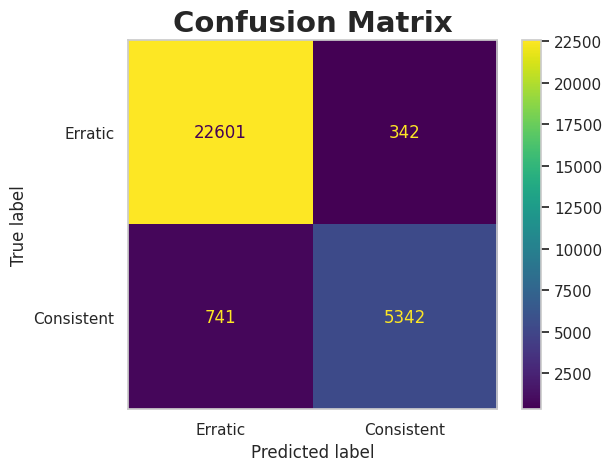

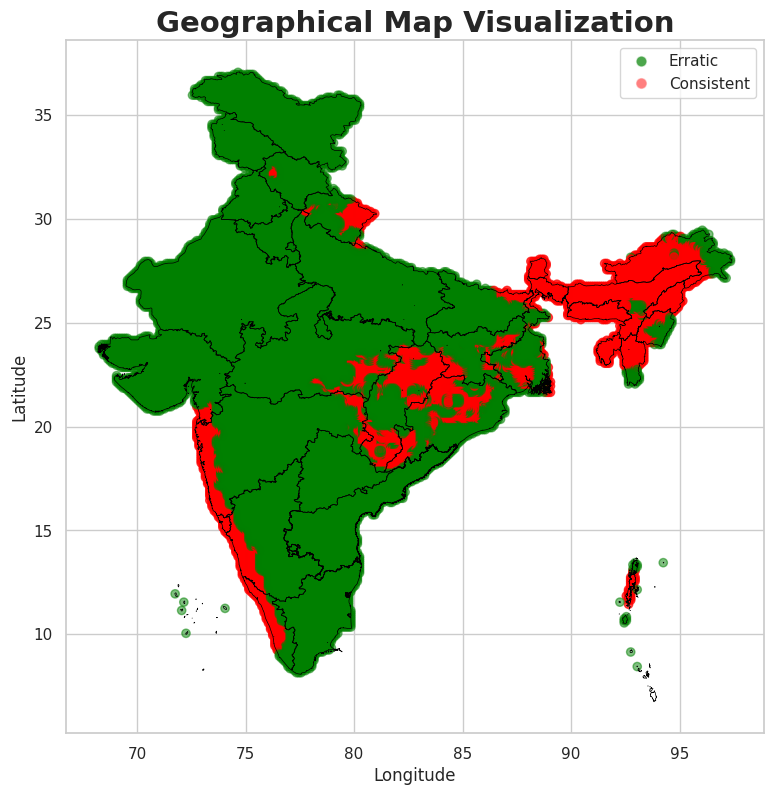

In [24]:
final_y_pred, final_y_true = test_and_evaluate(
    model=model,
    dataframe=variance_sorted_land_only_india_dataset,
    lat_range=None,
    lon_range=None,
    threshold_value=threshold_value,
    cm_savename='../images/cm_final.pdf',
    geo_map_savename='../images/geo_map_final.pdf'
)

In [25]:
df = variance_sorted_land_only_india_dataset.copy()

# Creating a new column 'prediction' that aligns the predictions with the DataFrame rows.
df['prediction'] = df['LOC_ID'].map(final_y_pred)

rainfall_data = df.iloc[:, 4:-3].copy() # Using -3 to exclude the newly added columns

# Calculating the mean and variance for each row (location) across the time series (axis=1).
all_means = rainfall_data.mean(axis=1)
all_variances = rainfall_data.var(axis=1)

# Stable mask: where the 'prediction' column is 1
stable_mask = (df['prediction'] == 1)

# Unstable mask: where the 'prediction' column is NOT 1
unstable_mask = (df['prediction'] != 1)

# Apply the masks to the pre-calculated Series and convert to lists
stable_mean = all_means[stable_mask].tolist()
stable_variance = all_variances[stable_mask].tolist()

unstable_mean = all_means[unstable_mask].tolist()
unstable_variance = all_variances[unstable_mask].tolist()

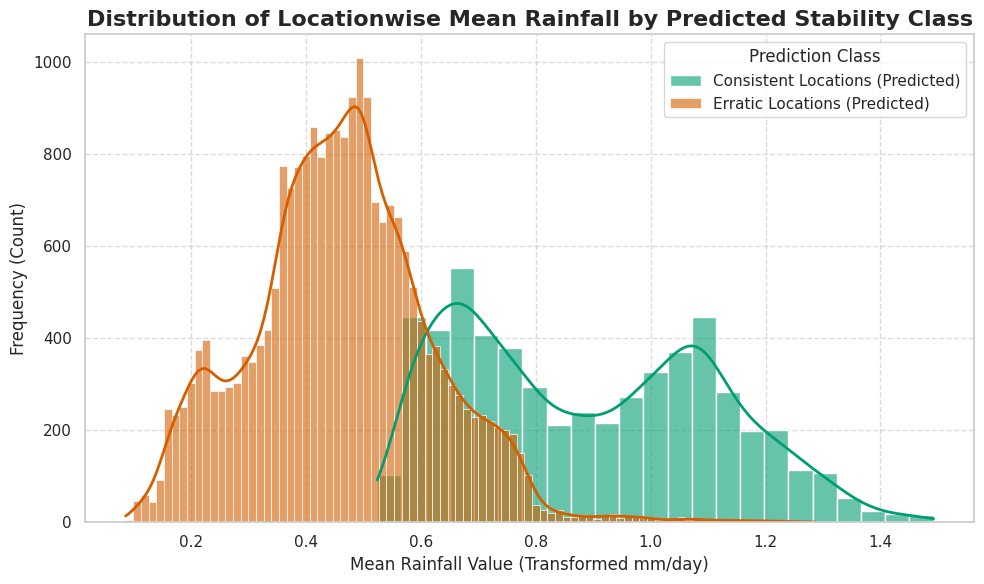

In [26]:
plt.figure(figsize=(10, 6))
sns.set_palette(sns.color_palette("colorblind")) 

sns.histplot(
    stable_mean, 
    label='Consistent Locations (Predicted)', 
    color=sns.color_palette("colorblind")[2], # Green/Teal for stable
    alpha=0.6,
    kde=True, # Add Kernel Density Estimate for smooth curve
    line_kws={'linewidth': 2}
)
sns.histplot(
    unstable_mean, 
    label='Erratic Locations (Predicted)', 
    color=sns.color_palette("colorblind")[3], # Red/Orange for unstable
    alpha=0.6,
    kde=True,
    line_kws={'linewidth': 2}
)

# 3. Add Titles, Labels, and Legend
plot_title = 'Distribution of Locationwise Mean Rainfall by Predicted Stability Class'

# Apply plotting instructions
plt.title(plot_title, fontsize=16, fontweight='bold')

plt.xlabel("Mean Rainfall Value (Transformed mm/day)", fontsize=12)
plt.ylabel("Frequency (Count)", fontsize=12)

plt.legend(title='Prediction Class', loc='best', frameon=True)

# 4. Final Touches
plt.grid(True, linestyle='--', alpha=0.7) # Add grid for readability
plt.tight_layout()
plt.savefig('../images/mean_by_class.pdf', format='pdf')
plt.show()

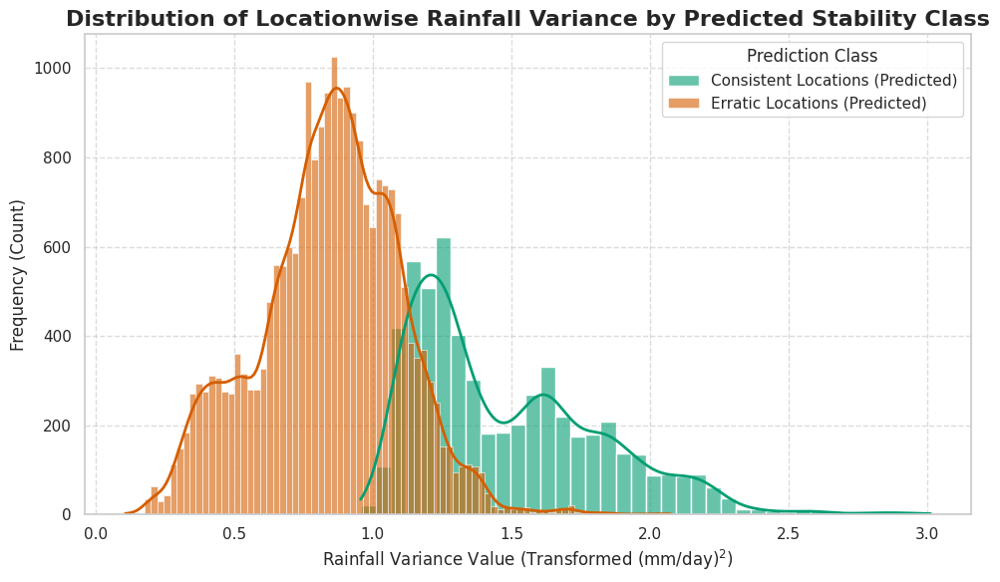

In [27]:
plt.figure(figsize=(10, 6))
sns.set_palette(sns.color_palette("colorblind")) 

sns.histplot(
    stable_variance, 
    label='Consistent Locations (Predicted)', 
    color=sns.color_palette("colorblind")[2], # Green/Teal for stable
    alpha=0.6,
    kde=True, # Add Kernel Density Estimate for smooth curve
    line_kws={'linewidth': 2}
)
sns.histplot(
    unstable_variance, 
    label='Erratic Locations (Predicted)', 
    color=sns.color_palette("colorblind")[3], # Red/Orange for unstable
    alpha=0.6,
    kde=True,
    line_kws={'linewidth': 2}
)

# 3. Add Titles, Labels, and Legend
plot_title = 'Distribution of Locationwise Rainfall Variance by Predicted Stability Class'

# Apply plotting instructions
plt.title(plot_title, fontsize=16, fontweight='bold')

plt.xlabel("Rainfall Variance Value (Transformed (mm/day)$^2$)", fontsize=12)
plt.ylabel("Frequency (Count)", fontsize=12)

plt.legend(title='Prediction Class', loc='best', frameon=True)

# 4. Final Touches
plt.grid(True, linestyle='--', alpha=0.7) # Add grid for readability
plt.tight_layout()
plt.savefig('../images/variance_by_class.pdf', format='pdf')
plt.show()